In [3]:
import json
import warnings
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt

from collections import Counter # creating an item counter
from influxdb_client.client.warnings import MissingPivotFunction
from appliedphd2019.general import tokens, data_caching, data_imputation


#Pavlo. What is counting_locations
from appliedphd2019.traffic.flanders_vehicle_count import counting_locations, flanders_handler, metadata


%load_ext autoreload
%autoreload 2


warnings.simplefilter("ignore", MissingPivotFunction)

# Get access to mapbox maps
px.set_mapbox_access_token(tokens.get_mapbox_access_token())

flandersHandler = flanders_handler.FlandersHandler()


ModuleNotFoundError: No module named 'appliedphd2019'

In [2]:
# %load_ext pycodestyle_magic
# %flake8_on --max_line_length 119

# Exploration of Flanders road data
## documentation

- **Voertuigklasse 1** = Deze voertuigklasse was voorzien voertuigen met geschatte lengte tussen 0m en 1,00m. **Deze gegevens worden door AWV en het verkeerscentrum niet meer gebruikt.** (vb. moto's.) De sporadische metingen in deze voertuigklasse zijn weinig tot niet betrouwbaar.
                       
- **Voertuigklasse 2** = Personenwagens = voertuigen met geschatte lengte tussen 1,00m en 4,90m
                        
- **Voertuigklasse 3** = Bestelwagens = voertuigen met geschatte lengte tussen 4,90m en 6,90m
                        
- **Voertuigklasse 4** = Ongelede vrachtwagens = voertuigen metvgeschatte lengte tussen 6,90m en 12,00m (bv.:Vrachtwagen of trekker)
                        
- **Voertuigklasse 5** = Gelede vrachtwagens of bussen= voertuigen met geschatte lengte langer dan 12,00m

    bv.: vrachtwagen+aanhangwagen, trekker+aanhangwagen of bus
    
    
**voertuigsnelheid rekenkundig** = Som (vi) / n (met vi = individuele snelheid van een voertuig binnen deze voertuigklasse)

                        Waarde bereik 0..200 km/h
                        
                        Bijzondere waarden:
                        - 251: Initiële waarde
                        - 254: Berekening niet mogelijk
                        - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                        
**voertuigsnelheid harmonisch** = n / Som(1/vi)  (met vi = individuele snelheid van een voertuig binnen deze voertuigklasse)

                          Bijzondere waarden:                    # Special values:
                         - 251: Initiële waarde                  # Initial value
                         - 254: Berekening niet mogelijk         # Calculation not possible
                         - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                                #no vehicles passed within this vehicle class


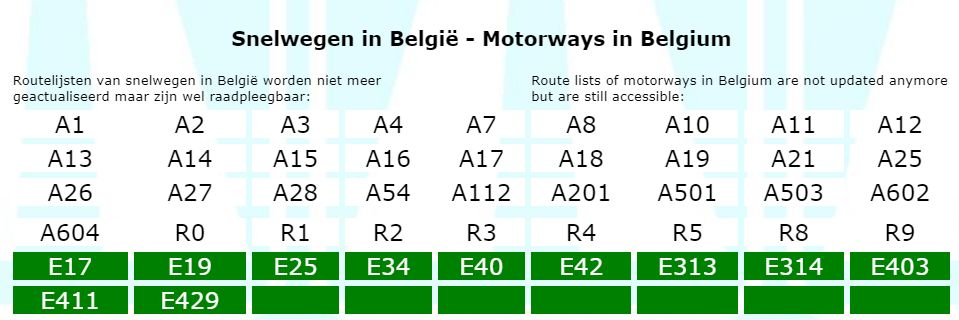

# Exploration of Flanders road data

## Metadata parameters (FL)
De onderstaande output geeft info weer over de parameters. Enkele belangrijke info samengevat:
- Ident_8 = [Referentiepunten langs de genummerde wegen](http://www.geopunt.be/catalogus/datasetfolder/e51b4737-d160-4240-ba58-df3d68ab17f2)
- lve_nr = Nummer van de LVE (Lokale VerwerkingsEenheid). Een LVE verwerkt de gegevens van een groep meetpunten.
- Kmp_Rsys = Referentiepunt gebruikt in de systemen van het Vlaams Verkeerscentrum.  
- Rijstrook = De letter duidt het type van de rijstrook aan.
        R: rijstrook  
        B: Bijzonder Overrijdbare Bedding (BOB) of busbaan  
        TR: meting van het verkeer in tegengestelde richting (meestal bij Tunnels) op de R-rijstrook  
        P: Pechstrook  
        W: parking of andere weg  
        S: spitsstrook  
        A: meetpunt op een gearceerd gedeelte van de weg  
        De nummering start bij R10 voor de eerste reguliere rijstrook op de hoofdrijbaan. De nummering stijgt van rechts/trager naar links/sneller.  
      Rijstroken met 09, 08, 07, ... liggen hier dan rechts van en stellen meestal op- en afritten, invoegstroken, net bijgekomen rijstroken, spitsstroken of BOB's voor.  
      Rijstroken 11, 12, 13, ... liggen dan links van de rijstrook R10.  
      Het nummer 00 wordt gebruikt voor een meetpunt op de pechstrook (P00).  
      De TR-rijstrook is identiek aan de overeenkomstige R-rijstrook (TR10=R10,TR11=R11,TR12=R12,...), alleen geeft het meetpunt enkel de minuutdata van het "spookverkeer" door.  exits/entriesexits/entries
      (De meetgegevens voor TR10 zijn afkomstig van dezelfde meetlussen als deze voor R10.)
        
        
- **Voertuigklasse 1** = Deze voertuigklasse was voorzien voertuigen met geschatte lengte tussen 0m en 1,00m. **Deze gegevens worden door AWV en het verkeerscentrum niet meer gebruikt.** (vb. moto's.) De sporadische metingen in deze voertuigklasse zijn weinig tot niet betrouwbaar.
                       
- **Voertuigklasse 2** = Personenwagens = voertuigen met geschatte lengte tussen 1,00m en 4,90m
                        
- **Voertuigklasse 3** = Bestelwagens = voertuigen met geschatte lengte tussen 4,90m en 6,90m
                        
- **Voertuigklasse 4** = Ongelede vrachtwagens = voertuigen metvgeschatte lengte tussen 6,90m en 12,00m (bv.:Vrachtwagen of trekker)
                        
- **Voertuigklasse 5** = Gelede vrachtwagens of bussen= voertuigen met geschatte lengte langer dan 12,00m ( bv.: vrachtwagen+aanhangwagen, trekker+aanhangwagen of bus)
    
    
**voertuigsnelheid rekenkundig** = Som (vi) / n (met vi = individuele snelheid van een voertuig binnen deze voertuigklasse)

                        Waarde bereik 0..200 km/h
                        
                        Bijzondere waarden:
                        - 251: Initiële waarde
                        - 254: Berekening niet mogelijk
                        - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                        
**voertuigsnelheid harmonisch** = n / Som(1/vi)  (met vi = individuele snelheid van een voertuig binnen deze voertuigklasse)

                          Bijzondere waarden:                    # Special values:
                         - 251: Initiële waarde                  # Initial value
                         - 254: Berekening niet mogelijk         # Calculation not possible
                         - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                                #no vehicles passed within this vehicle class
      


## Metadata parameters (ENG)
The output below provides info on the parameters. Some important info summarized:  
- **Ident_8** = [Reference points along the numbered roads](http://www.geopunt.be/catalogus/datasetfolder/e51b4737-d160-4240-ba58-df3d68ab17f2) #Pavlo. Highway name and direction 
- **lve_nr** = Number of the LVE (Local Processing Unit). An LVE processes the data of a group of measuring points.  
- **Kmp_Rsys** = Reference point used in the systems of the Flemish Traffic Center.  
- **Lane** = The letter indicates the type of lane.


    **R**: ring lane  
    **B**: Special Crossing Bedding (BOB) or bus lane  
    **TR**: measurement of traffic in the opposite direction (usually at Tunnels) in the R lane  
    **P**: breakdown lane  
    **W**: parking or other road  
    **S**: rush hour lane  
    **A**: measuring point on a shaded part of the road  
    Numbering starts at R10 for the first regular lane on the main roadway. Numbering increases from right/trailer to left/fast lane.
    Lanes with 09, 08, 07, ... are then to the right of this and usually represent entrance/exit lanes, merge lanes, newly added lanes, rush-hour lanes or PDOs.  
    Lanes 11, 12, 13, ... are then located to the left of lane R10.  
    The number 00 is used for a measuring point on the breakdown lane (P00).  
    The TR lane is identical to the corresponding R lane (TR10=R10,TR11=R11,TR12=R12,...), only the measuring point transmits only the minute data of the "ghost traffic".  
    (The measurement data for TR10 come from the same measurement loops as those for R10.)
        
          
            
- **Voertuigklasse 1** = This vehicle class was provided vehicles with approximate lengths between 0m and 1.00m. **This data is no longer used by AWV and the traffic center.** (E.g., motorcycles.) The sporadic measurements in this vehicle class are little or not reliable..
                       
- **Voertuigklasse 2** = Passenger cars = vehicles with approximate length between 1.00m and 4.90m
                        
- **Voertuigklasse 3**  Vans = vehicles with approximate length between 4.90m and 6.90m
                        
- **Voertuigklasse 4** = Unarticulated trucks = vehicles with estimated length between 6.90m and 12.00m (e.g.:Truck or tractor)
                        
- **Voertuigklasse 5** = Articulated trucks or buses= vehicles with approximate length longer than 12.00m (e.g.: truck+trailer, tractor+trailer or bus)
  
     
      
  **voertuigsnelheid rekenkundig** (vehicle speed arithmetic)= Sum (vi) / n (with vi = individual speed of a vehicle within this vehicle class)    

                        Waarde bereik 0..200 km/h
                        
                        Bijzondere waarden:
                        - 251: Initiële waarde
                        - 254: Berekening niet mogelijk
                        - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                        
**voertuigsnelheid harmonisch** = n / Som(1/vi)  (met vi = individuele snelheid van een voertuig binnen deze voertuigklasse)

                          Bijzondere waarden:                    # Special values:
                         - 251: Initiële waarde                  # Initial value
                         - 254: Berekening niet mogelijk         # Calculation not possible
                         - 252: geen voertuigen binnen deze voertuigklasse gepasseerd.
                                #no vehicles passed within this vehicle class
      

As the output above shows, we have counting locations on the:

- (B07) Special Crossing Bedding (BOB) or bus lane # What is the difference beween B07, B08, B09?
- (B08) Special Crossing Bedding (BOB) or bus lane # What is the difference beween B07, B08, B09?
- (B09) Special Crossing Bedding (BOB) or bus lane # What is the difference beween B07, B08, B09?
- (P00) breakdown lane
- (R06) -
- (R07)
- (R08)
- (R09) exits/entries
- (R10) 1st lane
- (R11) 2nd lane
- (R12) 3rd lane
- (R13) 4th lane
- (S09) rush hour lane
- (TR09)
- (TR10)
- (TR11)
- (TR12)
- (W09) parking or other way

In [ ]:
metadata.get_parameter_info()

In [2]:
locations_df = counting_locations.get_counting_locations()
locations_df

,unieke_id,beschrijvende_id,volledige_naam,Ident_8,lve_nr,Kmp_Rsys,Rijstrook,X_coord_EPSG_31370,Y_coord_EPSG_31370,lengtegraad_EPSG_4326,breedtegraad_EPSG_4326,geometry
1,3640,H291L10,Parking Kruibeke,A0140002,437.0,94.695,R10,144474.5297,208293.5324,4.289731,51.184608,POINT (144474.530 208293.532)
2,3638,H292L20,Parking Kruibeke,A0140001,437.0,94.692,R11,144485.3962,208275.6893,4.289887,51.184447,POINT (144485.396 208275.689)
3,3639,H292L30,Parking Kruibeke,A0140001,437.0,94.692,R12,144483.6764,208278.8952,4.289862,51.184476,POINT (144483.676 208278.895)
4,2304,H202L10,Snede noordzijde sleuf Boom,N1770002,168.0,10.268,R10,150233.1199,200546.9427,4.372085,51.115002,POINT (150233.120 200546.943)
5,2303,H208L10,Snede noordzijde sleuf Boom,A0121311,168.0,NaN,R10,150226.4523,200546.5205,4.371990,51.114999,POINT (150226.452 200546.521)
...,...,...,...,...,...,...,...,...,...,...,...,...
4473,3621,H291L30,"Snede kmpt. 5,2",A0100002,484.0,5.170,R12,139424.1908,174832.2879,4.218465,50.883756,POINT (139424.191 174832.288)
4474,3620,H291L20,"Snede kmpt. 5,2",A0100002,484.0,5.170,R11,139424.3763,174828.5109,4.218467,50.883722,POINT (139424.376 174828.511)
4475,3629,H292L20,Halve snede kmpt. 95.7,A0140001,492.0,96.711,R11,146021.6375,209579.7963,4.311844,51.196182,POINT (146021.638 209579.796)
4476,3628,H292L10,Halve snede kmpt. 95.7,A0140001,492.0,96.711,R10,146021.6375,209579.7963,4.311844,51.196182,POINT (146021.638 209579.796)


In [2]:
counting_locations.plot_counting_locations()

NameError: name 'counting_locations' is not defined

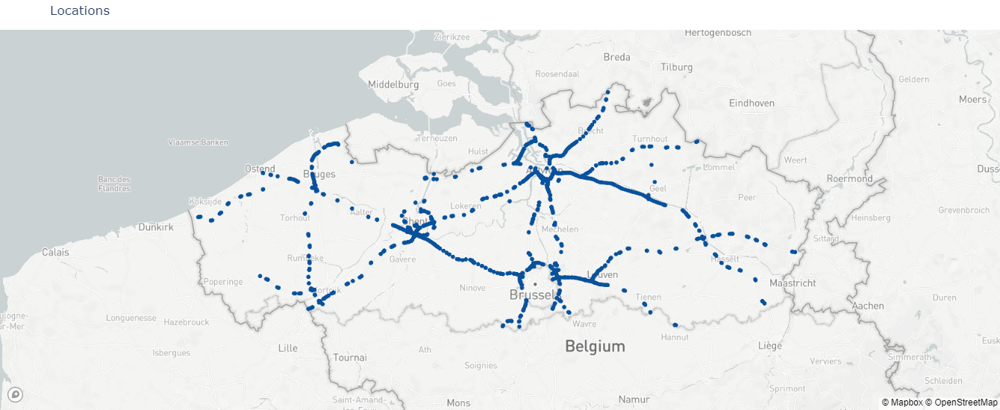

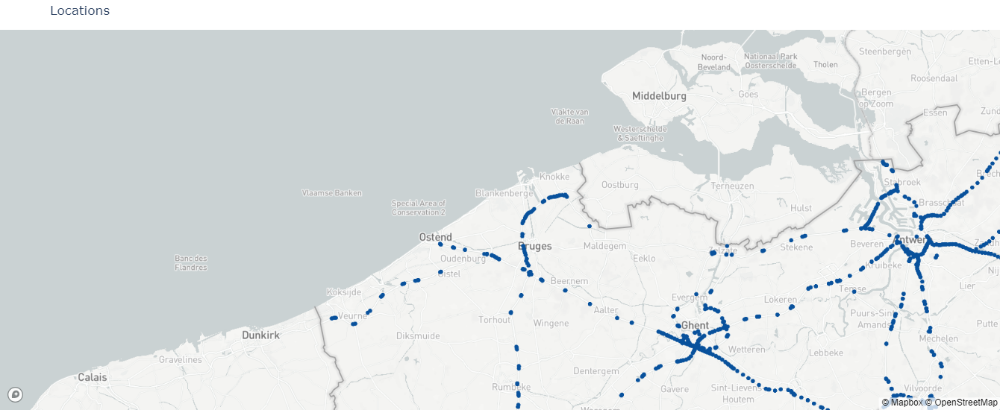

In [9]:
## 'Rijstrook(Lane) analysisdf_locations = counting_locations.get_counting_locations()
#df_locations

counting_locations.plot_counting_locations()


## How sensors are grouped (by lve_nr)

In [4]:
grouped_df = locations_df.groupby('lve_nr')['unieke_id'].unique().reset_index()

In [11]:
statistics = grouped_df['unieke_id'].apply(lambda x: len(x)).value_counts()
statistics = statistics.sort_index()
statistics

1      4
2     26
3     70
4     88
5     32
6     71
7     18
8     90
9     32
10    48
11    36
12    36
13     8
14     9
15     8
16    10
17     3
18     2
19     3
20     3
22     2
23     1
24     1
26     1
Name: unieke_id, dtype: int64

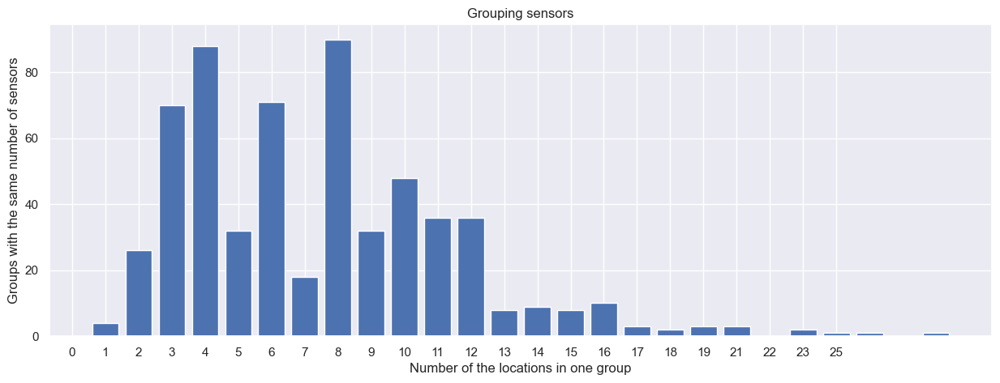

In [12]:
fig = plt.figure(figsize=(15, 5))
plt.bar(statistics.index, statistics.values)
plt.xticks(range(len(statistics.index)), statistics.index-1)

plt.xlabel('Number of the locations in one group')
plt.ylabel('Groups with the same number of sensors')
plt.title('Grouping sensors')

plt.show()

## How many roads with different types of lanes

In [5]:
# Pavlo.Check unique values 'Rijstrook' for Flanders
unique_values = locations_df['Rijstrook'].unique()
print(unique_values)

['R10' 'R11' 'R12' 'R13' 'W09' 'B09' 'S09' 'R08' 'R09' 'B07' 'P00' 'B08'
 'A11' 'TR12' 'TR10' 'TR11' 'R07' 'R06' 'TR09']


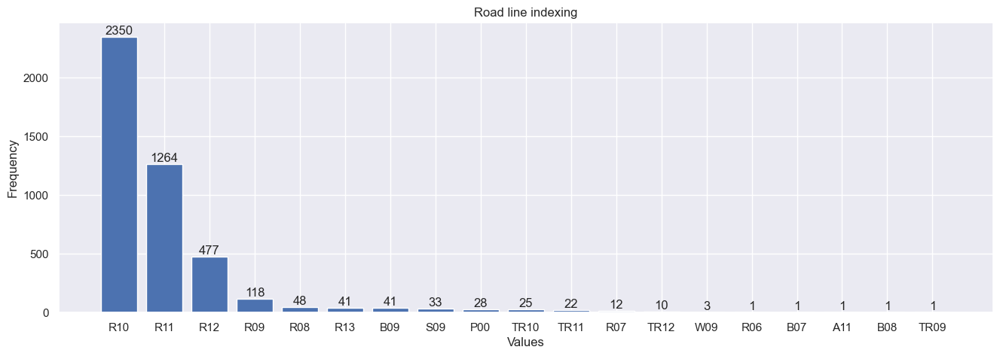

In [3]:
data = locations_df['Rijstrook']


# Count the number of values in a column
value_counts = data.value_counts()

# Get the values and their frequencies
values = value_counts.index
frequencies = value_counts.values

fig = plt.figure(figsize=(16, 5))




for i, v in enumerate(frequencies):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.bar(values, frequencies)
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Road line indexing')

plt.show()


In [29]:
#locations_R0_df['Ident_8']#.astype(float)
locations_R0_df['Rijstrook']#.astype(float)

180     R11
182     R10
184     R11
186     R10
190     R11
       ... 
4428    R11
4440    R10
4441    R12
4442    R11
4443    R10
Name: Rijstrook, Length: 193, dtype: object

In [30]:
#print(json.dumps(Counter(locations_R0_df['Rijstrook']), indent=4, sort_keys=True))

#Pavlo. Check unique values 'Rijstrook' for Brussels
unique_values = locations_R0_df['Rijstrook'].unique()
print(len(unique_values))  # Выводит количество уникальных значений
print(json.dumps(Counter(locations_R0_df['Rijstrook']), indent=4, sort_keys=True))

#Pavlo. Check unique values 'Rijstrook' for all dump
unique_values = locations_df['Rijstrook'].unique()
print(len(unique_values))  # Outputs number of unique values
print(json.dumps(Counter(locations_df['Rijstrook']), indent=4, sort_keys=True))

4
{
    "R10": 69,
    "R11": 69,
    "R12": 54,
    "R13": 1
}
19
{
    "A11": 1,
    "B07": 1,
    "B08": 1,
    "B09": 41,
    "P00": 28,
    "R06": 1,
    "R07": 12,
    "R08": 48,
    "R09": 118,
    "R10": 2350,
    "R11": 1264,
    "R12": 477,
    "R13": 41,
    "S09": 33,
    "TR09": 1,
    "TR10": 25,
    "TR11": 22,
    "TR12": 10,
    "W09": 3
}


## IVE_nr analisys

In [71]:
# unique_values = locations_R0_df['Rijstrook'].unique()
# print(unique_values)

# Pavlo.Check unique values 'lve_nr' for Brussels
unique_values = locations_df['lve_nr'].unique()
print(unique_values)
print(len(unique_values))  # Outputs number of unique values
# print(json.dumps(Counter(locations_df['lve_nr']), indent=4, sort_keys=True))


counter = Counter(locations_df['lve_nr'])
sorted_counter = dict(sorted(counter.items(), key=lambda x: x[1], reverse=False))

# print(json.dumps(sorted_counter, indent=4, sort_keys=True))

[437. 168. 492. 491. 490. 243. 415. 252. 127. 122. 284. 225.  54. 237.
 123. 365. 148. 367. 125. 124. 366. 253. 226. 126. 370. 369. 368. 128.
 373. 372. 371. 227. 129. 376. 375. 374. 131. 377. 130. 447. 132. 378.
 448. 133. 134. 445. 135. 229. 516. 532. 559. 440. 560.  15.  19.  20.
  91. 280. 561.  21.  38. 562. 563. 564.  39.  62.  64. 565. 566.  70.
 567. 568. 569. 293. 224. 223. 570. 571. 142.  40.  66. 138.  67. 208.
  68. 213. 212.  69. 214.  71. 294.  72.  73. 172.   3. 251. 268. 269.
 270. 209. 210.  49. 515. 517. 228. 519. 518. 520. 341. 521. 185. 343.
 528. 290. 527. 522. 523. 291. 529. 285. 170. 306. 333. 489. 307. 171.
 434. 174. 347. 173. 488. 231. 176. 331. 349. 348. 175. 177. 329. 281.
 178. 271. 179. 272. 533. 181. 180. 572. 534. 183. 182. 535. 536. 538.
 539. 540.  27. 537. 531. 556. 548.  28. 549. 550. 551. 552.  29. 553.
 274.  32.  33. 583. 584. 585. 586.  76. 588. 589. 587.  77.  78.  79.
  55.  80.  81.  16.  82.  17.  18.  88.  13.  43.  56. 433. 245.  86.
  84. 

In [84]:
unique_values

array([437., 168., 492., 491., 490., 243., 415., 252., 127., 122., 284.,
       225.,  54., 237., 123., 365., 148., 367., 125., 124., 366., 253.,
       226., 126., 370., 369., 368., 128., 373., 372., 371., 227., 129.,
       376., 375., 374., 131., 377., 130., 447., 132., 378., 448., 133.,
       134., 445., 135., 229., 516., 532., 559., 440., 560.,  15.,  19.,
        20.,  91., 280., 561.,  21.,  38., 562., 563., 564.,  39.,  62.,
        64., 565., 566.,  70., 567., 568., 569., 293., 224., 223., 570.,
       571., 142.,  40.,  66., 138.,  67., 208.,  68., 213., 212.,  69.,
       214.,  71., 294.,  72.,  73., 172.,   3., 251., 268., 269., 270.,
       209., 210.,  49., 515., 517., 228., 519., 518., 520., 341., 521.,
       185., 343., 528., 290., 527., 522., 523., 291., 529., 285., 170.,
       306., 333., 489., 307., 171., 434., 174., 347., 173., 488., 231.,
       176., 331., 349., 348., 175., 177., 329., 281., 178., 271., 179.,
       272., 533., 181., 180., 572., 534., 183., 18

ValueError: could not convert string to float: 'R10'

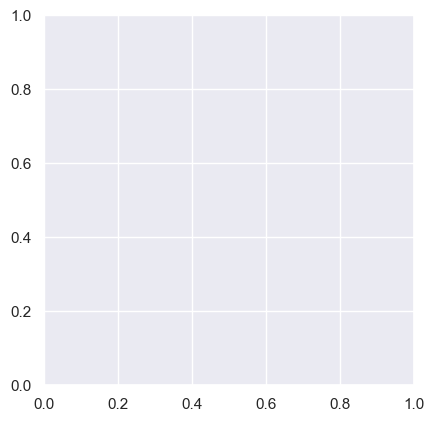

In [7]:
plt.pie(unique_values, labels=values, autopct='%1.1f%%')
plt.title('Value Distribution')
plt.show()

# Exploration of Brussels Big Ring

## Get locations of the big ring

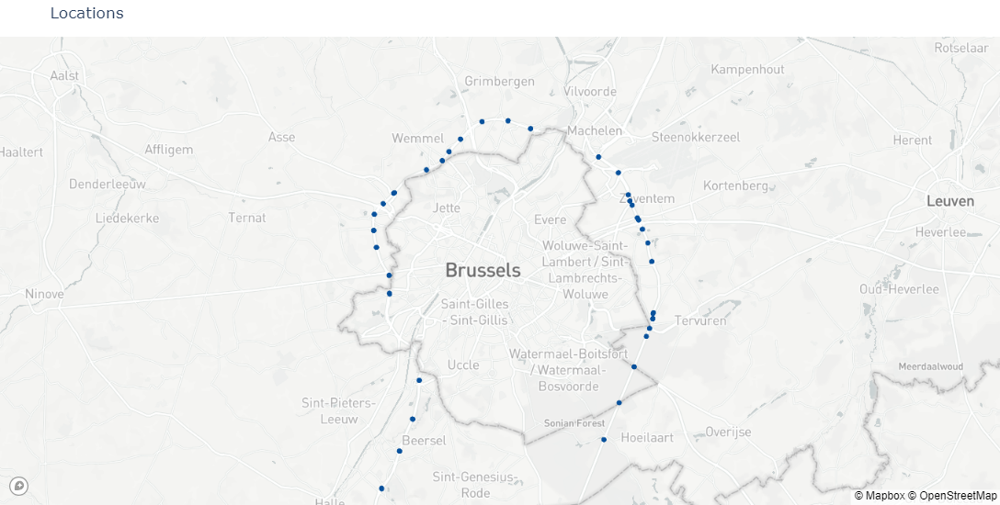

,unieke_id,beschrijvende_id,volledige_naam,Ident_8,lve_nr,Kmp_Rsys,Rijstrook,X_coord_EPSG_31370,Y_coord_EPSG_31370,lengtegraad_EPSG_4326,breedtegraad_EPSG_4326,geometry
180,1066,H191L20,"R0 kmpt 23,7 dubbele seinbrug",R0000002,131.0,23.804,R11,157414.6110,167207.9389,4.473964,50.815264,POINT (157414.611 167207.939)
182,1065,H191L10,"R0 kmpt 23,7 dubbele seinbrug",R0000002,131.0,23.804,R10,157411.4378,167209.2693,4.473919,50.815276,POINT (157411.438 167209.269)
184,1064,H192L20,"R0 kmpt 23,7 dubbele seinbrug",R0000001,131.0,23.808,R11,157421.3089,167205.8349,4.474059,50.815245,POINT (157421.309 167205.835)
186,1063,H192L10,"R0 kmpt 23,7 dubbele seinbrug",R0000001,131.0,23.808,R10,157424.7643,167204.2825,4.474108,50.815231,POINT (157424.764 167204.283)
190,1061,H292L20,complex Tervuren - 4-armen (1) (noordzij,R0000001,130.0,25.020,R11,157787.4395,168460.7136,4.479281,50.826521,POINT (157787.440 168460.714)
...,...,...,...,...,...,...,...,...,...,...,...,...
4428,1878,H292L20,Complex UZ Jette,R0000001,196.0,45.420,R11,145848.2341,175958.5865,4.309741,50.893962,POINT (145848.234 175958.587)
4440,1899,H191L10,Complex Wemmel Deel 2 Zuid,R0000002,223.0,44.459,R10,146691.5002,176426.2970,4.321723,50.898171,POINT (146691.500 176426.297)
4441,1898,H192L30,Complex Wemmel Deel 2 Zuid,R0000001,223.0,44.455,R12,146679.6878,176436.0937,4.321555,50.898259,POINT (146679.688 176436.094)
4442,1897,H192L20,Complex Wemmel Deel 2 Zuid,R0000001,223.0,44.455,R11,146676.3829,176438.4319,4.321508,50.898280,POINT (146676.383 176438.432)


In [4]:
#_ = counting_locations.plot_counting_locations()  #Pavlo. I don't understand how does it work(


#locations_R0_df = counting_locations.get_counting_locations_for_one_highway(highway='R000',
#                                                                            include_entries_exits=False,
#                                                                            zoom=9)


#Pavlo. Where find info about all highways (highway='R000')
locations_R0_df = counting_locations.get_counting_locations_for_one_highway(highway='R000',
                                                                            include_entries_exits=False,
                                                                            zoom=10)

#locations_all_df = counting_locations.get_counting_locations()
#locations_all_df
locations_R0_df


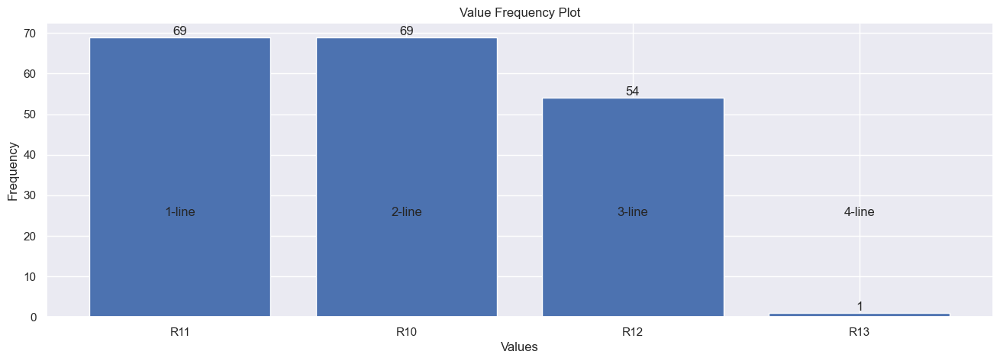

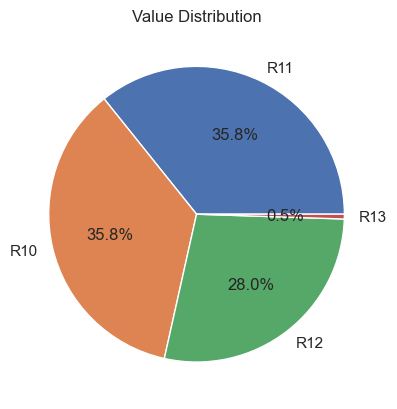

In [5]:
# Pavlo.Bar Chart 'Rijstrook'

data = locations_R0_df['Rijstrook']


# Count the number of values in a column
value_counts = data.value_counts()

# Get the values and their frequencies
values = value_counts.index
frequencies = value_counts.values


fig = plt.figure(figsize=(16, 5))
for i, v in enumerate(frequencies):
    plt.text(i, v, str(v), ha='center', va='bottom')

for i, value in enumerate(values):
    plt.text(i, 25, str(i+1)+'-line', ha='center')
    
    
plt.bar(values, frequencies)
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Value Frequency Plot')
plt.show()


# Pie chart
plt.pie(frequencies, labels=values, autopct='%1.1f%%')
plt.title('Value Distribution')




plt.show()

## Fetch and Prepare Data
### Fetch data and only select parameters of interest
Let us start with considering only 3 lanes at one location.


## Exploration of Flanders road data

#### Start of database time period: 2021-04-18
#### about 1 160 543 timestamps - 2,2 years



actueel_publicatie  
beschikbaar - availability  
beschikbaarheidsgraad - vailability degree  
class_1_verkeersintensiteit - traffic intensity  
class_1_voertuigsnelheid_harmonisch - vehicle speed harmonic  
class_1_voertuigsnelheid_rekenkundig - 
...  
...  
...  
defect -   
geldig - valid  
lve_nr -   
tijd_laatst_gewijzigd -  


In [7]:
def remove_features_out_of_interest(df):
    """
    Remove the features out of interest.

    Note: this results in less than half of the memory usage for this DataFrame
    """
    df.drop(['actueel_publicatie',
             'beschikbaar', #availability
             'beschikbaarheidsgraad',  #availability degree
             'class_1_verkeersintensiteit', #traffic intensity
             'class_1_voertuigsnelheid_harmonisch', #vehicle speed harmonic
             'class_1_voertuigsnelheid_rekenkundig',
             'class_2_voertuigsnelheid_rekenkundig',
             'class_3_voertuigsnelheid_rekenkundig',
             'class_4_voertuigsnelheid_rekenkundig',
             'class_5_voertuigsnelheid_rekenkundig',
             'defect',
             'geldig', #valid
             'lve_nr',
             'tijd_laatst_gewijzigd'], axis=1, level=1, inplace=True)

    
    
def fetch_Flanders_data(locations, batch_size=25, verbose=1):
    flanders_data = []
    for start_i in range(0, len(locations), batch_size):
        end_i = start_i + batch_size
        print(f'{start_i}:{end_i}')
        batch = flandersHandler.fetch_Flanders_data(location_ids=locations[start_i: end_i],
                                                    # start='2022-11-01',
                                                    # stop='2021-11-15',
                                                    reuse_if_in_cache=True,
                                                    force_new_fetch=False,
                                                    verbose=verbose)
        remove_features_out_of_interest(batch)
        batch = batch.resample("1min").asfreq()
        flanders_data += [batch]
    df = pd.concat(flanders_data, axis=1)
    df.index = pd.DatetimeIndex(df.index)  # this also decreases the memory usage

    return df


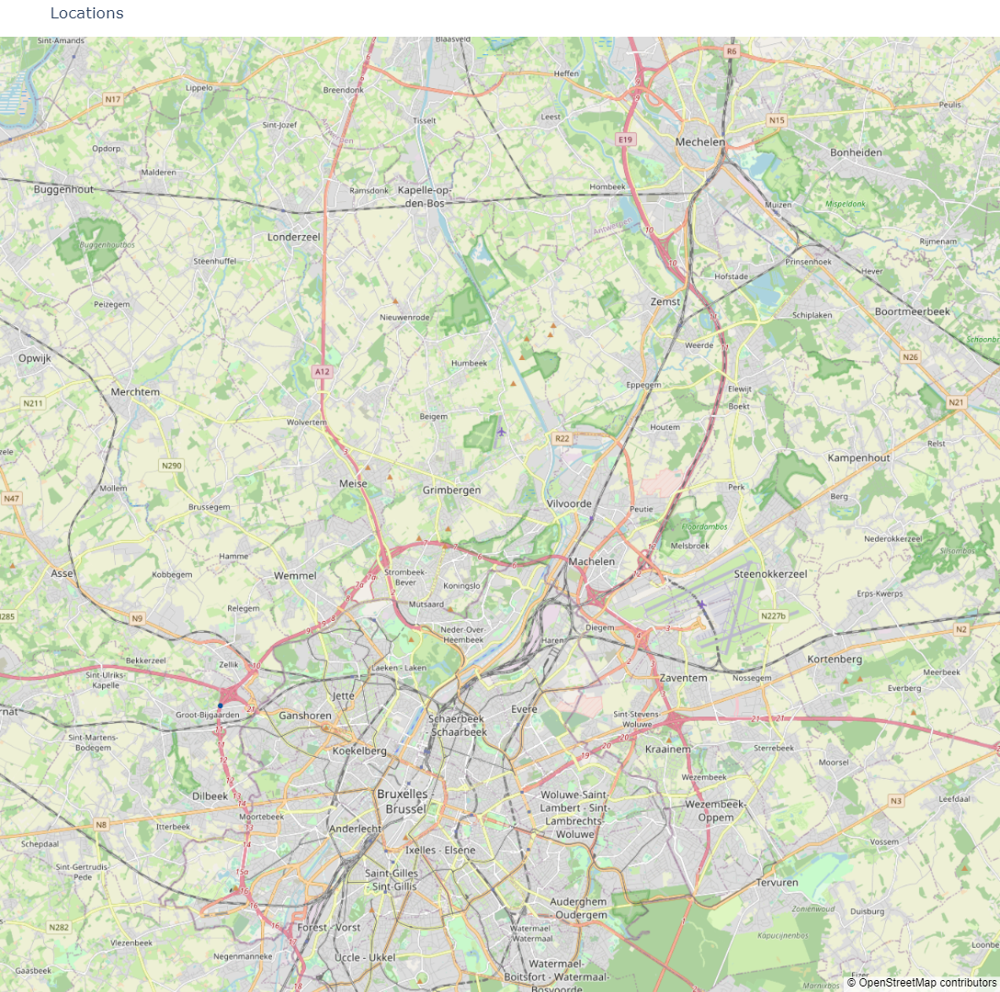

,unieke_id,beschrijvende_id,volledige_naam,Ident_8,lve_nr,Kmp_Rsys,Rijstrook,X_coord_EPSG_31370,Y_coord_EPSG_31370,lengtegraad_EPSG_4326,breedtegraad_EPSG_4326,geometry
2115,3164,S291L30,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R12,143098.8407,173622.6924,4.270706,50.872937,POINT (143098.841 173622.692)
2116,3163,S291L20,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R11,143095.9574,173624.5873,4.270665,50.872954,POINT (143095.957 173624.587)
2117,3162,S291L10,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R10,143092.6504,173625.4815,4.270618,50.872962,POINT (143092.650 173625.481)


In [34]:
locations_ids = ['3162', '3163', '3164']

_ = counting_locations.plot_counting_locations(locations_R0_df[locations_R0_df['unieke_id'].isin(locations_ids)],
                                               height=150, zoom=12, mapbox_style="open-street-map")
locations_R0_df[locations_R0_df['unieke_id'].isin(locations_ids)]

In [182]:
locations_R0_df[locations_R0_df['unieke_id'].isin(locations_ids)]

,unieke_id,beschrijvende_id,volledige_naam,Ident_8,lve_nr,Kmp_Rsys,Rijstrook,X_coord_EPSG_31370,Y_coord_EPSG_31370,lengtegraad_EPSG_4326,breedtegraad_EPSG_4326,geometry
2115,3164,S291L30,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R12,143098.8407,173622.6924,4.270706,50.872937,POINT (143098.841 173622.692)
2116,3163,S291L20,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R11,143095.9574,173624.5873,4.270665,50.872954,POINT (143095.957 173624.587)
2117,3162,S291L10,Knooppunt Groot-Bijgaarden West,R0000001,418.0,49.142,R10,143092.6504,173625.4815,4.270618,50.872962,POINT (143092.650 173625.481)


In [46]:
locations_ids

['3162', '3163', '3164', '1899']

In [209]:
test_data = data_caching.get_data('test_df', fetch_Flanders_data,
                                  force_recalculation=True, online=False,
                                  locations=['3162', '3163', '3164'], batch_size=25)

# R0_data = fetch_Flanders_data(locations_ids, batch_size=25, verbose=1)
test_data

"test_df" is being recomputed...
0:25


  0%|          | 0/3 [00:00<?, ?it/s]

3162                              \
                          bezettingsgraad class_2_verkeersintensiteit   
_time                                                                   
2021-04-18 13:48:00+00:00             4.0                        14.0   
2021-04-18 13:49:00+00:00             3.0                        13.0   
2021-04-18 13:50:00+00:00             3.0                         9.0   
2021-04-18 13:51:00+00:00             4.0                        13.0   
2021-04-18 13:52:00+00:00             4.0                        15.0   
...                                   ...                         ...   
2023-07-03 12:06:00+00:00             6.0                        11.0   
2023-07-03 12:07:00+00:00             NaN                         NaN   
2023-07-03 12:08:00+00:00             7.0                         3.0   
2023-07-03 12:09:00+00:00             7.0                         0.0   
2023-07-03 12:10:00+00:00             4.0                         8.0   

                                                               \
                          class_2_voertuigsnelheid_harmonisch   
_time                                                           
2021-04-18 13:48:00+00:00                                95.0   
2021-04-18 13:49:00+00:00                                91.0   
2021-04-18 13:50:00+00:00                                93.0   
2021-04-18 13:51:00+00:00                                95.0   
2021-04-18 13:52:00+00:00                                98.0   
...                                                       ...   
2023-07-03 12:06:00+00:00                                93.0   
2023-07-03 12:07:00+00:00                                 NaN   
2023-07-03 12:08:00+00:00                                94.0   
2023-07-03 12:09:00+00:00                               252.0   
2023-07-03 12:10:00+00:00                                94.0   

                                                       \
                          class_3_verkeersintensiteit   
_time                                                   
2021-04-18 13:48:00+00:00                         0.0   
2021-04-18 13:49:00+00:00                         0.0   
2021-04-18 13:50:00+00:00                         0.0   
2021-04-18 13:51:00+00:00                         2.0   
2021-04-18 13:52:00+00:00                         0.0   
...                                               ...   
2023-07-03 12:06:00+00:00                         3.0   
2023-07-03 12:07:00+00:00                         NaN   
2023-07-03 12:08:00+00:00                         2.0   
2023-07-03 12:09:00+00:00                         3.0   
2023-07-03 12:10:00+00:00                         1.0   

                                                               \
                          class_3_voertuigsnelheid_harmonisch   
_time                                                           
2021-04-18 13:48:00+00:00                               252.0   
2021-04-18 13:49:00+00:00                               252.0   
2021-04-18 13:50:00+00:00                               252.0   
2021-04-18 13:51:00+00:00                                98.0   
2021-04-18 13:52:00+00:00                               252.0   
...                                                       ...   
2023-07-03 12:06:00+00:00                                89.0   
2023-07-03 12:07:00+00:00                                 NaN   
2023-07-03 12:08:00+00:00                                88.0   
2023-07-03 12:09:00+00:00                                91.0   
2023-07-03 12:10:00+00:00                                85.0   

                                                       \
                          class_4_verkeersintensiteit   
_time                                                   
2021-04-18 13:48:00+00:00                         0.0   
2021-04-18 13:49:00+00:00                         0.0   
2021-04-18 13:50:00+00:00                         1.0   
2021-04-18 13:51:00+00:00                         0

In [217]:
test_df = flandersHandler.fetch_Flanders_data(location_ids=['3162'], start='2022-04-18', stop='2023-07-01', keep_columns=None, #, '1000'  stop=None
                            reuse_if_in_cache=False, force_new_fetch=False, local_path_prefix='../../data/MIV', # By default reuse_if_in_cache=False, force_new_fetch=False
                            verbose=1)





  0%|          | 0/1 [00:00<?, ?it/s]

In [218]:
test_df

3162              \
                          actueel_publicatie beschikbaar   
_time                                                      
2022-04-18 00:00:00+00:00                  0           1   
2022-04-18 00:01:00+00:00                  0           1   
2022-04-18 00:02:00+00:00                  0           1   
2022-04-18 00:03:00+00:00                  0           1   
2022-04-18 00:04:00+00:00                  0           1   
...                                      ...         ...   
2023-06-30 23:55:00+00:00                  0           1   
2023-06-30 23:56:00+00:00                  0           1   
2023-06-30 23:57:00+00:00                  0           1   
2023-06-30 23:58:00+00:00                  0           1   
2023-06-30 23:59:00+00:00                  0           1   

                                                                 \
                          beschikbaarheidsgraad bezettingsgraad   
_time                                                             
2022-04-18 00:00:00+00:00                   100               2   
2022-04-18 00:01:00+00:00                   100               1   
2022-04-18 00:02:00+00:00                   100               2   
2022-04-18 00:03:00+00:00                   100               3   
2022-04-18 00:04:00+00:00                   100               1   
...                                         ...             ...   
2023-06-30 23:55:00+00:00                   100               3   
2023-06-30 23:56:00+00:00                   100               3   
2023-06-30 23:57:00+00:00                   100               2   
2023-06-30 23:58:00+00:00                   100               3   
2023-06-30 23:59:00+00:00                   100               1   

                                                       \
                          class_1_verkeersintensiteit   
_time                                                   
2022-04-18 00:00:00+00:00                           0   
2022-04-18 00:01:00+00:00                           0   
2022-04-18 00:02:00+00:00                           0   
2022-04-18 00:03:00+00:00                           0   
2022-04-18 00:04:00+00:00                           0   
...                                               ...   
2023-06-30 23:55:00+00:00                           0   
2023-06-30 23:56:00+00:00                           0   
2023-06-30 23:57:00+00:00                           0   
2023-06-30 23:58:00+00:00                           0   
2023-06-30 23:59:00+00:00                           0   

                                                               \
                          class_1_voertuigsnelheid_harmonisch   
_time                                                           
2022-04-18 00:00:00+00:00                               252.0   
2022-04-18 00:01:00+00:00                               252.0   
2022-04-18 00:02:00+00:00                               252.0   
2022-04-18 00:03:00+00:00                               252.0   
2022-04-18 00:04:00+00:00                               252.0   
...                                                       ...   
2023-06-30 23:55:00+00:00                               252.0   
2023-06-30 23:56:00+00:00                               252.0   
2023-06-30 23:57:00+00:00                               252.0   
2023-06-30 23:58:00+00:00                               252.0   
2023-06-30 23:59:00+00:00                               252.0   

                                                                \
                          class_1_voertuigsnelheid_rekenkundig   
_time                                                            
2022-04-18 00:00:00+00:00                                  0.0   
2022-04-18 00:01:00+00:00                                  0.0   
2022-04-18 00:02:00+00:00                                  0.0   
2022-04-18 00:03:00+00:00                                  0.0   
2022-04-18 00:04:00+00:00                                  0.0   
...                   

## Exploring Missing Timestamps

#### One month can have from 40,320 to 44,640 minutes (timestamps).  
#### 12 coulums per each locations (?)

In [ ]:
# Calculate the difference between adjacent timestamps
time_diff = test_df.index.to_series().diff()

# Search for missing values (gaps in time)
missing_times = test_df[time_diff != pd.Timedelta(minutes=1)].index

# Output information about passes
print(f"Number of timestamps skipped: {len(missing_times)}")
print("Missing Timestamps:")
print(missing_times)

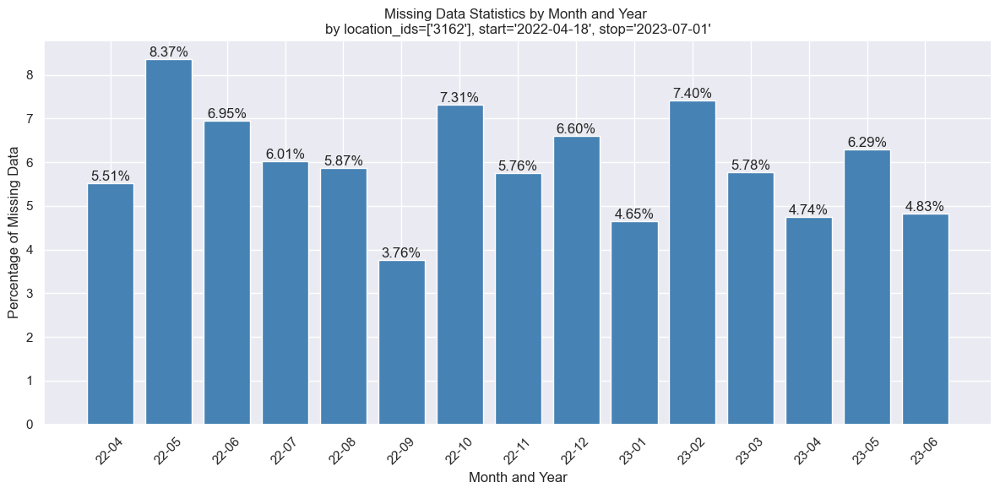

In [244]:
# Convert the percentage data to a DataFrame
percentage_df = pd.DataFrame(missing_data_percentage, columns=['percentage'])
percentage_df.reset_index(inplace=True)
percentage_df['year_month'] = percentage_df.apply(lambda x: f"{str(int(x['year']))[2:]}-{int(x['month']):02d}", axis=1)

# Create a bar plot
fig, ax = plt.subplots(figsize=(12, 6))
ax.bar(percentage_df['year_month'], percentage_df['percentage'], color='steelblue', width=0.8)

# Add labels to the bars
for i, percentage in enumerate(percentage_df['percentage']):
    ax.text(i, percentage, f"{percentage:.2f}%", ha='center', va='bottom')

# Set the x-axis label and rotate the tick labels
ax.set_xlabel('Month and Year')
ax.set_ylabel('Percentage of Missing Data')
ax.set_title("Missing Data Statistics by Month and Year \nby location_ids=['3162'], start='2022-04-18', stop='2023-07-01'")
plt.xticks(rotation=45)

# Display the plot
plt.tight_layout()
plt.show()

## Data downloading of Big ring of Brussels 

In [ ]:
R0_data = data_caching.get_data('R0_df', fetch_Flanders_data, # get data check cash R0_df (set of locations
                                force_recalculation=False, online=False, # if True - data will be overwritten, False - give back data from cach  - online=False - should be always Falsh 
                                locations=locations_R0_df.unieke_id, batch_size=5)

# R0_data = fetch_Flanders_data(locations_ids, batch_size=25, verbose=1)
R0_data

"R0_df" is not fount in local cache.
"R0_df" is being recomputed...
0:5


  0%|          | 0/5 [00:00<?, ?it/s]

5:10


  0%|          | 0/5 [00:00<?, ?it/s]

10:15


  0%|          | 0/5 [00:00<?, ?it/s]

15:20


  0%|          | 0/5 [00:00<?, ?it/s]

20:25


  0%|          | 0/5 [00:00<?, ?it/s]

25:30


  0%|          | 0/5 [00:00<?, ?it/s]

30:35


  0%|          | 0/5 [00:00<?, ?it/s]

35:40


  0%|          | 0/5 [00:00<?, ?it/s]

40:45


  0%|          | 0/5 [00:00<?, ?it/s]

45:50


  0%|          | 0/5 [00:00<?, ?it/s]

50:55


  0%|          | 0/5 [00:00<?, ?it/s]

55:60


  0%|          | 0/5 [00:00<?, ?it/s]

60:65


  0%|          | 0/5 [00:00<?, ?it/s]

65:70


  0%|          | 0/5 [00:00<?, ?it/s]

70:75


  0%|          | 0/5 [00:00<?, ?it/s]

75:80


  0%|          | 0/5 [00:00<?, ?it/s]

80:85


  0%|          | 0/5 [00:00<?, ?it/s]

85:90


  0%|          | 0/5 [00:00<?, ?it/s]

90:95


  0%|          | 0/5 [00:00<?, ?it/s]

95:100


  0%|          | 0/5 [00:00<?, ?it/s]

100:105


  0%|          | 0/5 [00:00<?, ?it/s]

105:110


  0%|          | 0/5 [00:00<?, ?it/s]

110:115


  0%|          | 0/5 [00:00<?, ?it/s]

115:120


  0%|          | 0/5 [00:00<?, ?it/s]

120:125


  0%|          | 0/5 [00:00<?, ?it/s]

125:130


  0%|          | 0/5 [00:00<?, ?it/s]

130:135


  0%|          | 0/5 [00:00<?, ?it/s]

135:140


  0%|          | 0/5 [00:00<?, ?it/s]

140:145


  0%|          | 0/5 [00:00<?, ?it/s]

145:150


  0%|          | 0/5 [00:00<?, ?it/s]

150:155


  0%|          | 0/5 [00:00<?, ?it/s]

155:160


  0%|          | 0/5 [00:00<?, ?it/s]

160:165


  0%|          | 0/5 [00:00<?, ?it/s]

165:170


  0%|          | 0/5 [00:00<?, ?it/s]

170:175


  0%|          | 0/5 [00:00<?, ?it/s]

175:180


  0%|          | 0/5 [00:00<?, ?it/s]

180:185


  0%|          | 0/5 [00:00<?, ?it/s]

185:190


  0%|          | 0/5 [00:00<?, ?it/s]

In [ ]:
ax = R0_data.iloc[:1440*4, :10].plot(subplots=True, figsize=(20, 10))
plt.tight_layout()

In [ ]:
def visualise_data_completeness(df, figsize=(12, 10)):
    df_vis = df.loc[:,(slice(None),'bezettingsgraad')].T.copy() #.droplevel(0, axis=1).T
    df_vis.index = [f'{id_n} {parameter}' for id_n, parameter in df_vis.index]
    data_imputation.visualise_data_completeness(df_vis, figsize=figsize)


visualise_data_completeness(R0_data, figsize=(12, 25))

#### Analyse onrustigheid

In [ ]:
onrustigheid_df = pd.DataFrame()
onrustigheid_df['3162'] = R0_data.loc[:, ('3162', 'onrustigheid')]#.T.droplevel(1).T
onrustigheid_df['3163'] = R0_data.loc[:, ('3163', 'onrustigheid')]
onrustigheid_df['3164'] = R0_data.loc[:, ('3164', 'onrustigheid')]
onrustigheid_df['Date'] = onrustigheid_df.index.date
onrustigheid_df['Time'] = onrustigheid_df.index.time.astype(str)


In [ ]:
n_days = 14
onrustigheid_melted = onrustigheid_df[612:1440 * n_days + 612].melt(id_vars=['Date', 'Time'],
                                                           value_vars=['3162', '3163', '3164'])

g = sns.relplot(data=onrustigheid_melted,
                x='Time', y='value', row='Date', hue='variable',
                kind='line', aspect=5, height=3, palette='Set2')
_ = g.set(ylim=(0, 1000))


In [ ]:
def agitation(speeds):
    component_1 = sum([v**2 for v in speeds]) / len(speeds)
    component_2 = (sum(speeds) / len(speeds))**2
    agitation = component_1 - component_2
    print(f'agitation = {component_1:.0f} - {component_2:.0f} = {agitation:.0f}')
    
    
agitation([60, 60, 60])

In [ ]:
agitation([70, 60, 60])

In [ ]:
agitation([50, 60, 60])

In [ ]:
agitation([50, 60, 70])

## Remove noise
### Negative outliers
None of the parameters should be negative, so we remove negative values with nan values.

In [245]:
def remove_negative_values(df_raw):
    df = df_raw.copy()
    n_negative_values = df[df < 0].count().sum()
    for col in df.columns:  # doing it per column is much faster for large datasets
        df[col][df[col] < 0] = np.nan
    perc_removed = n_negative_values / (df.shape[0]*df.shape[1]) * 100
    print(f'{n_negative_values} negative values ({perc_removed:.2f}%) have been removed.')
    
    return df


R0_without_neg = remove_negative_values(R0_data)


NameError: name 'R0_data' is not defined

### Positive outliers

<span style="color:red">--> what to do with the speed of 252 (no vehicles detected)?</span>.

TODO: apply maximum threshold for each feature

In [ ]:
# max_values = {'bezettingsgraad': 100, 'voertuigsnelheid_harmonish': 200, 'voertuigsnelheid}
# for column in R0_without_neg.columns:
#     print(column)

## Impute gaps via interpolation
As you can see below, there are quite some short time periods with missing values over all parameters.

In [ ]:
_ = data_imputation.construct_daily_matrices(R0_without_neg.T.loc[['3162', '3163', '3164']],
                                             FEEDBACK=True, n_plots=4)

We **linearly interpolate** missing values, with **maximum 5** consecutive minutes to fill.

In [ ]:
limit = 5  # Maximum number of consecutive NaNs to fill.
df_imputed = R0_without_neg.interpolate(method="linear", limit=limit)
data_imputation.print_missing_percentage(df_imputed)
_ = data_imputation.construct_daily_matrices(df_imputed.T.loc[['3162', '3163', '3164']],
                                             FEEDBACK=True, n_plots=4)

In [ ]:
visualise_data_completeness(df_imputed, figsize=(12, 25))


As you can observer, there are much more missing values in the beginning of the data set compared to the end.

## Combine measures of all lanes
Question: 
- should we separately investigate the 5 locations with 2 (instead of 3) lanes?

How:
- bezettingsgraad -> averge
- verkeersintensiteit -> sum
- voertuigsnelheid_harmonisch -> harmonic average
- onrustigheid -> average

©, 2022, Sirris